# Groundwater flow – Solving PDEs using ODE solvers
Source: incomplete course notes for MatLab solvers, Session 4.2, from the NNESMO website:  
https://nnesmo2019.webspace.durham.ac.uk/practicals/session42/  
Dr Simon A Mathias, 
Department of Earth Sciences, 
Durham University

### Contents

- Groundwater flow in a confined aquifer  
- Spatial discretisation using finite differences  
- Development of the solution code  
- Plotting the results and comparing to an analytical solution  
- Stiff and non-stiff problems  
- Specifying the Jacobian pattern  

## Groundwater flow in a confined aquifer

A confined aquifer is bounded to the West by a lake and to the East by an impermeable fault zone.  
The aquifer is homogenous and isotropic and characterised by a transmissivity of 800 and a storativity of 0.01.  
The edge of the lake lies parallel to the fault zone and is separated by a distance of 1600 m.  
Initially the lake level is 50 m AOD (metres above ordinance datum).  
After a significant episode of snow melt in the mountains above, the water level in the lake is suddenly raised to 53 m AOD.  

The governing equation for one dimensional groundwater flow in a (un)confined aquifer takes the form

<img src="1-D+Steady+Flow+in+a+Confined+Aquifer.jpg" width="550" embed="True"/>
<img src="steady-flow-in-an-unconfined-aquifer-l.jpg"  width="550" embed="True"/>

In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import display, SVG 
from IPython.core.display import SVG
%config InlineBackend.figure_format="retina"
plt.rcParams.update({'figure.max_open_warning': 0})
import plotly.io as pio
pio.renderers.default='notebook'

In [2]:
from scipy.integrate import odeint, solve_ivp
import numpy as np
import seaborn as sns

In [3]:
import scipy
print("scipy:", scipy.__version__,"numpy:", np.__version__) 

scipy: 1.9.1 numpy: 1.22.3


In [4]:
pic=SVG(filename='flow per unit width, q’.svg', metadata="groundwater flow per unit width in unconfined aquifer")
pic

In [2]:
%precision 3

'%.3f'

In [4]:
%%HTML
<script src="require.js"></script>
<script src="https://cdn.plot.ly/plotly-2.14.0.min.js" charset="utf-8"></script>

$\frac {d}{dx}  K \frac {dh}{dx} = S \frac {dh}{dt}$

where S [-] is the aquifer storativity (which relates to the bulk compressibility of the aquifer),  
h [L] is the hydraulic head, t [T] is time, L [L] is distance and  
Q is $q*h$ [m^2/s] is the volumetric flow rate per unit breadth of confined aquifer, found from

where  T is the transmissivity of the aquifer (which relates to the bulk permeability of the aquifer).

Discharge per unit width of aquifer = $({Piezometric_{Head}}_{Upstream}-{Piezometric_{Head}}_{DownstreamEnd})/Length*{Coefficient}_{permeability}*{Aquifer}_{Thickness}$  
$$q=\frac{(h_o-h_1)}{L}\cdot k \cdot b$$

The relevant initial and boundary conditions can be written as follows:

$t_0$= 0  
$t_x$= 0.1, 0.3, 0.5, 1, 3, 5  in days  
T= 800  
S= 0.01  
L= 1600  
$h_I$= $h_1$= 50  
$h_0$= 53  
$$T dy^2/dx^2 - 0 dy/dx =S u$$  and  $$u= dt$$  

Volume of Confined Water for a change in head = $SAΔh$ where:  
- Volume 	= 	volume drained from a confined aquifer for a hydraulic head change, Δh, over an area, A (L³)  
- S 	= 	storativity (dimensionless)  
- A 	= 	area over which the head change occurs (L²)  
- Δh 	= 	change in head (L)  

- Discharge per unit width of aquifer - (Measured in M³ per Second)  
    - Discharge per unit width of aquifer is the rate of total discharge in the channel to the width considered.  
- Transmissivity - (Measured in M² per Second)  
    - Transmissivity is the rate at which groundwater flows horizontally through an aquifer

> Use the *solver 'odeint'* to develop a one-dimensional finite difference model to estimate the hydraulic head within the aquifer.  
Show the results as a plot of hydraulic head against distance, for the following times: 0.1, 0.3, 0.5, 1, 3, 5 and 7 days.

## Spatial discretisation using finite differences

The above problem is an example of a partial differential equation (PDE). However, if we discretise the problem in space, the problem becomes a coupled set of ordinary differential equations (ODE) with respect to time. Here we will use odeint to solve the large set of coupled ODEs that results from the spatial discretisation. We will use finite difference for spatial discretisation. However, other methods such as finite elements and pseudospectral methods can also be used in a similar way.

Let us consider a set of discrete points on the x-axis: $x_n$.

The corresponding set of hydraulic heads can be written as: h(x).

An approximation of flow per unit breadth, $q^*$, can be found from
$q_x =-k_x dh/dx$  

but note that these flow rates are defined at an alternative set of points: $x_b$.

The resulting set of ODEs to be solved takes the form 
$d/dx  K dh/dx = S \cdot dh/dt$

Letting ∆x → 0 and ∆t → 0 in (5) leads to the one-dimensional groundwater flow equation,
$∂h^2/∂x^2=1/k(∂h/∂t)−R(x,t)/K$  
R=recharge, for 0<x<a, t>0, (6) where we have introduced the hydraulic diffusivity k via $k=K/S_s$.

Recall that the relationship between and is $T = K b$  

Furthermore it can be shown that 

$h_2=53 m$  
$c_1= \frac {(h_2^2-h_1^2)}{L}+(N \cdot L/K)$  
$c_2= h_1^2$  
$h^2(x)=+h_1^2- (h_2^2-h_1^2)\frac {x}{L}+ \frac {Nx}{K} (L-x)$

## Development of the solution code

Create a new script-file:

### function onedimex()
1. Solves the one-dimensional confined aquifer flow equation using the python ODE solver 'odeint', when using the function argument 'odeint'.  
This older solver has some perks:  
- Solves a system of ordinary differential equations using ``lsoda`` from the FORTRAN library odepack.
- Solves the initial value problem for both stiff and non-stiff systems of first order ode's.  
2. otherwise this function solves the one-dimensional confined aquifer flow equation using the python ODE solver 'solve_ivp' . 

In [ ]:
from dataclasses import dataclass, asdict

@dataclass
class Aquiferflow:
    T: float = 800.0 
    S: float = 0.01 
    L: float = 1600.0
    hI: float= 50.0
    h0: float= 53.0
    t0: float= 0.01
    tf: float= 3.3
    
    @classmethod

In [41]:
T: float = 800.0 
S: float = 0.01 
L: float = 1600.0
hI: float= 50.0
h0: float= 53.0
t0: float= 0.01
tf: float= 3.3

def onedimex( solver):
    """ Solves the one-dimensional confined aquifer flow equation using a python ODE solver when using the function arg. 'odeint'
    :param int  T: Transmissivity (m^2/day)
    :param float S: Storativity (-)
    :param int  L: Length of the aquifer (m)
    :param int  hI: Initial hydraulic head (m)
    :param float  h0: Boundary head (m)
    :param int  x: location of points being solved for (m)
    :param int xB: location of finite difference block boundaries (m)
    :param float ta: time (days)
    :return float hFD: hydr. heads by finite differences
    """
    # Define model parameters    #  T,S, L, hI, h0,
    global  x, xB, t, hFD, ta, hI_vec
    #Define spatial grid
    N=20
    xB= np.linspace(0.0 ,L, N+1)
    #xB= np.logspace(-3,0,N+1)*L  ;  #xB
    x=(xB[0:N]+ xB[1:N+1])/2

    # Define the times of interest
    #t= np.array( [ 1.0, 100.0,3000.0], dtype='float32') 
    ta= np.linspace(0.1, 10.0, num=20)
    #  Define initial condition vector for the ode solver
    hI_vec= np.zeros( np.size(x))+ hI

    # Apply ode to obtain the finite difference solution     
    #print ( hI_vec, ta, hI_vec.dtype, ta.dtype, )
    #[t,hFD]= ode45(@MYodefun, t, hI_vec,options, x,xB,S,T,h0)
    if solver=="odeint":
        sol= odeint(myodefun, hI_vec, ta, args=(x,xB,S,T,h0), mxstep=200,)   #full_output=1,  Dfun=Dfun, mxstep=5000  
        #print( sol)
        hFD =sol[:, 1] 
        hFD = hFD.astype('float')
        t= sol[:, 0]
        t = t.astype('float')
    else: 
        solver_ivp()

    print("hFD:",hFD,"t:", t)

    return t, hFD

In [38]:
onedimex?

In [31]:
Aq= Aquiferflow
#print(Aq.__dict__) # asdict

In [41]:
ta

array([ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
        3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
        5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
        8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ])

In [42]:
t

100

In [43]:
hFD

array([  50.        ,  131.73130194,  212.71468144,  292.9501385 ,
        372.43767313,  451.17728532,  529.16897507,  606.41274238,
        682.90858726,  758.6565097 ,  833.6565097 ,  907.90858726,
        981.41274238, 1054.16897507, 1126.17728532, 1197.43767313,
       1267.9501385 , 1337.71468144, 1406.73130194, 1475.        ])

In [ ]:
plt.plot(ta, t, 'b', label='ta t') # sol[:, 0]   sol[:, 1]
plt.plot(ta, hFD , 'g', label='hFD ')
plt.legend(loc='best')
plt.xlabel('t')
plt.grid()
plt.show()

In [45]:
ta= np.linspace(0.10, 10.0, num=20)
ta

array([ 0.1       ,  0.62105263,  1.14210526,  1.66315789,  2.18421053,
        2.70526316,  3.22631579,  3.74736842,  4.26842105,  4.78947368,
        5.31052632,  5.83157895,  6.35263158,  6.87368421,  7.39473684,
        7.91578947,  8.43684211,  8.95789474,  9.47894737, 10.        ])

In [46]:
np.size(x)

20

So far all we have done is written some comments explaining what some of the subsequent variables are and defined the model parameter values.

The next step is to determine the locations on the x-axis that we are going to solve for.

In the above variable list we have x and xB. It is planned that x and xB will be vectors containing and , respectively.

Another point to note is that $x_B(1)=0$ and $x_B{(N+1)}=L$.

Add the following code to provide a discretisation for 20 equally spaced solution points

In [25]:
#Define spatial grid
N=20
xB= np.linspace(0.0,160,N+1);
#xB= np.logspace(-3,0,N+1)*L
xB

array([  0.,   8.,  16.,  24.,  32.,  40.,  48.,  56.,  64.,  72.,  80.,
        88.,  96., 104., 112., 120., 128., 136., 144., 152., 160.])

In [26]:
#for
x=(xB[0:N]+ xB[1:N+1])/2 ; x

array([  4.,  12.,  20.,  28.,  36.,  44.,  52.,  60.,  68.,  76.,  84.,
        92., 100., 108., 116., 124., 132., 140., 148., 156.])

Next we will add some code to define the times of interest and a vector containing the initial values for .

In [27]:
# Define the times of interest
t= np.array( [0.1, 1.0,4.0, 10.0, 30.0])      # 0.0, 
#  Define initial condition vector for the ode solver
hI_vec=  hI + np.array( np.zeros( np.size(x)) , dtype="float64") 

In [28]:
hI_vec

array([50., 50., 50., 50., 50., 50., 50., 50., 50., 50., 50., 50., 50.,
       50., 50., 50., 50., 50., 50., 50.])

### solve_ivp
This is the solver which should be used for new code, according to scipy. We need to use solver/method 'LSODA', instead of the default 'RK45' for handling possible stiffness. 

In [ ]:
def solver_ivp():
    """Apply LSODA to obtain the finite difference solution: Adams/BDF method with automatic stiffness detection and switching 
    :return float hFD: y Values of the solution at t.
    :return bunch sol_ivp: Bunch object with fields: y Values of the solution at t, t Time points, sol Found solution as OdeSolution instance; None if dense_output=False 
    """
    global t, hFD, sol_ivp
    #print ("hI_vec",hI_vec, hI_vec.shape,"t", t, t.shape,)
    # new code: scipy.integrate.solve_ivp(fun, t_span, y0, method='RK45', t_eval=None, 
    solSo = solve_ivp(myodefun, [t0, tf], hI_vec, args=(x,xB,S,T,h0), method='LSODA',dense_output=True,) #t_eval=ta, vectorized=True, method='LSODA',
    # notes: solSo is a bunch, t_eval needs equal ranges, 

    hFD =solSo["y"]
    #hFD = hFD.astype('float')
    t= solSo["t"]
    #t = t.astype('float')
    if hasattr(solSo,'sol') is True:
        sol_ivp = solSo["sol"]
    #print( hFD, t)
    return hFD, t

(array([[50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        ],
        [50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        ],
        [50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        ],
        [50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        ],
        [50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.        , 50.00000001,
         50.00000001],
        [50.        , 50.        , 50.        , 50.        , 50.        ,
         50.        , 50.        , 50.        , 50.00000001, 50.0000001

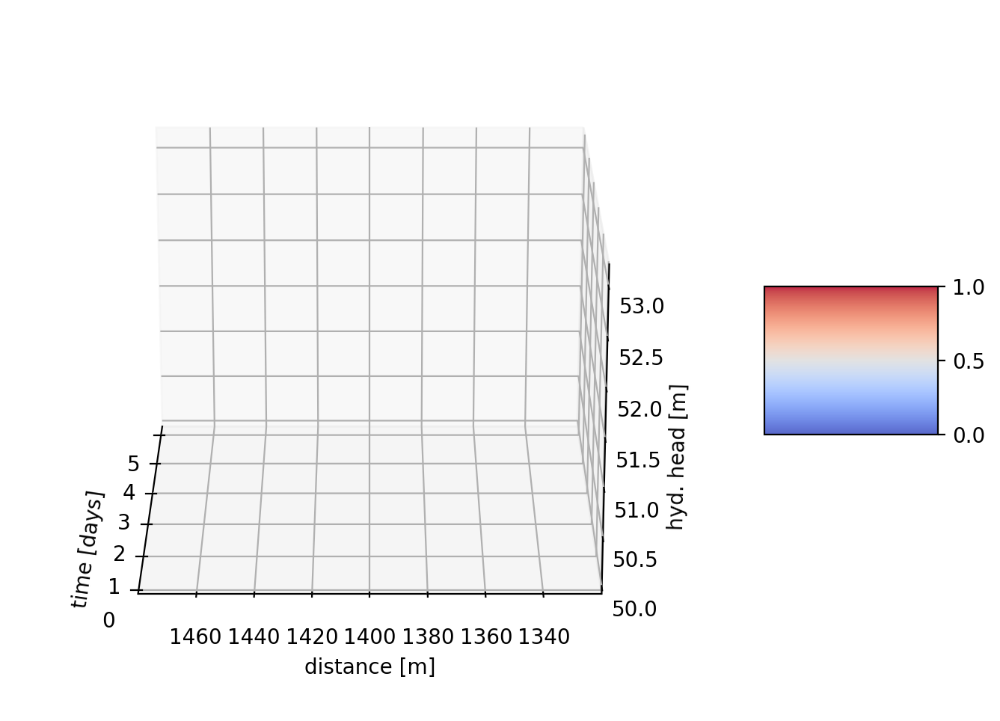

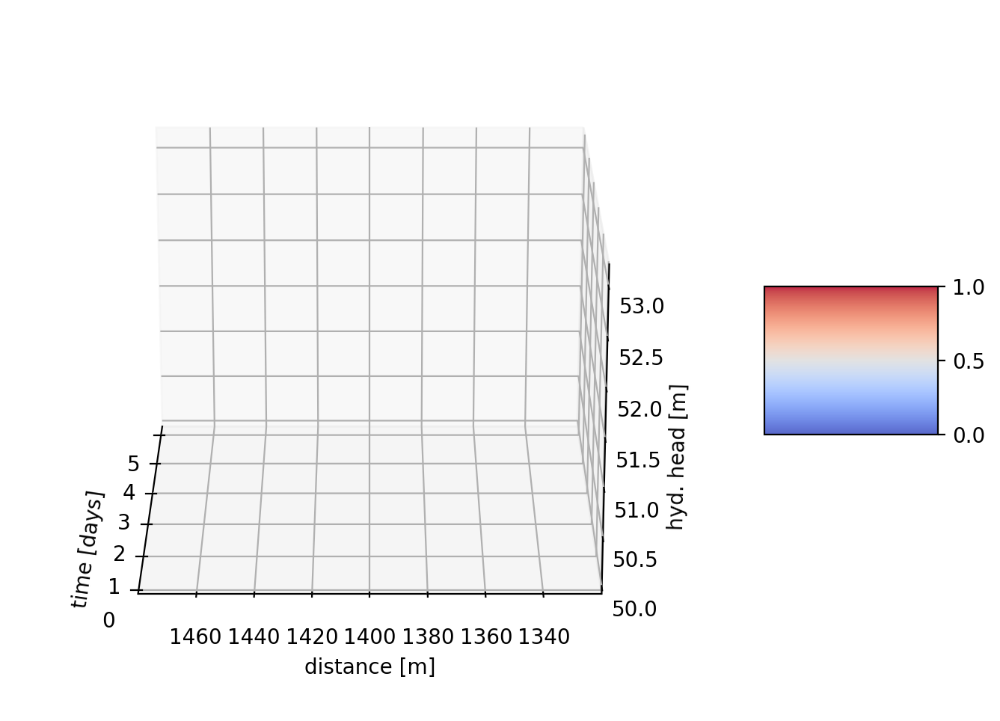

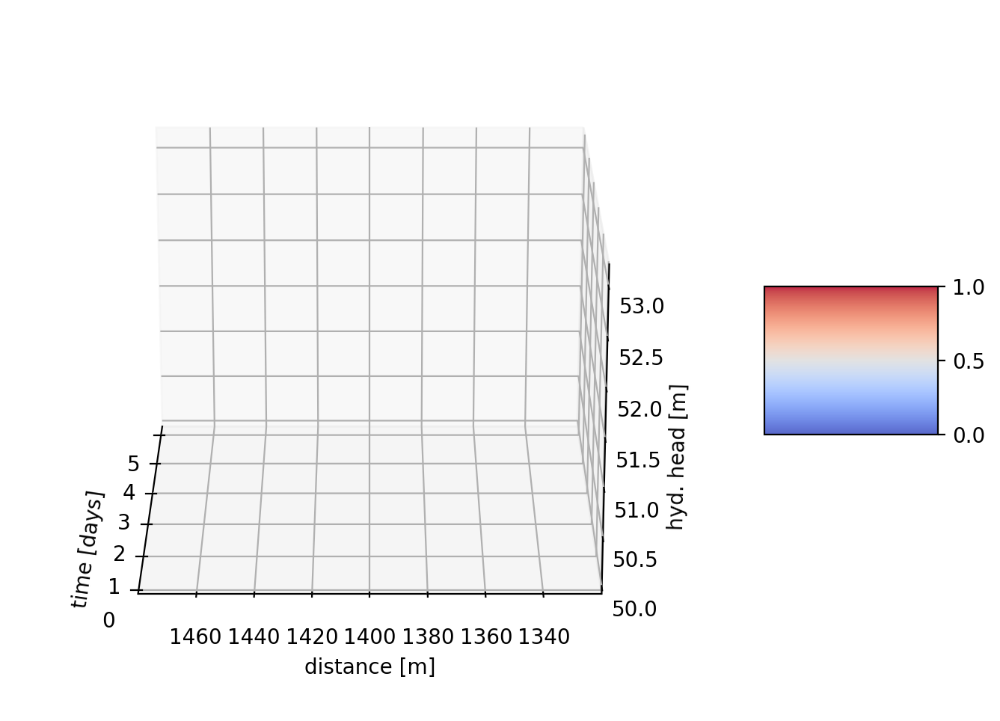

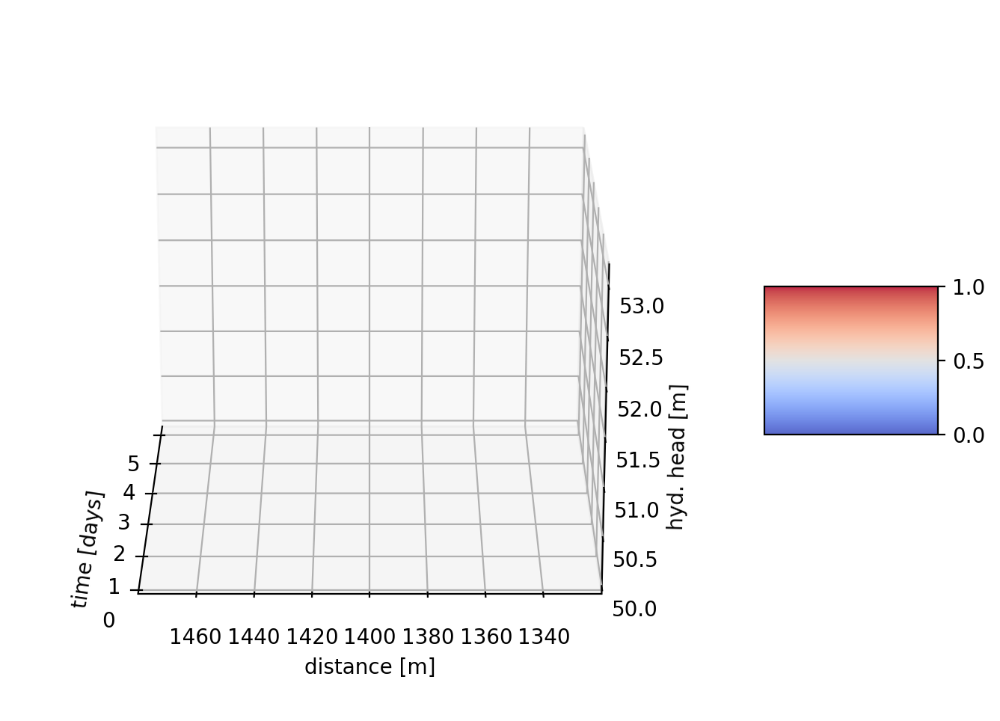

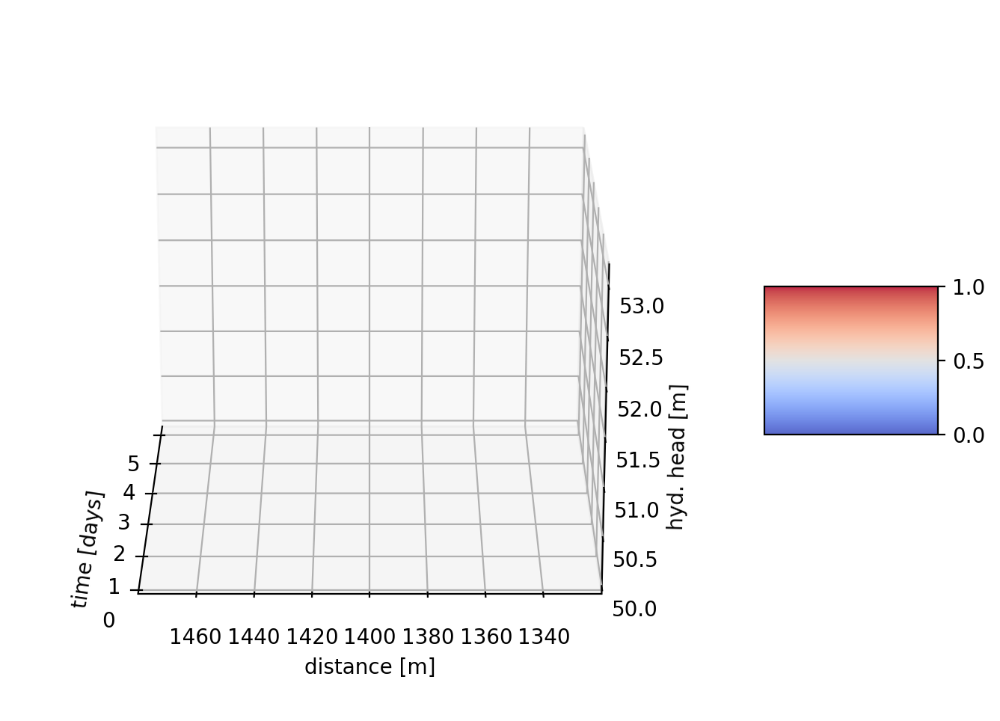

...

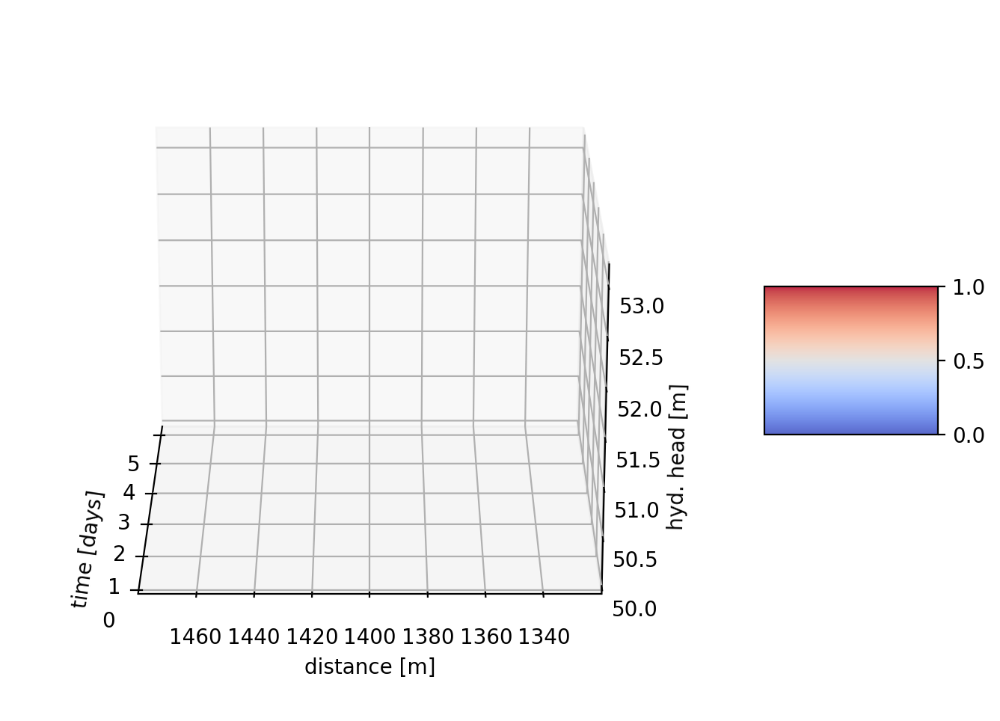

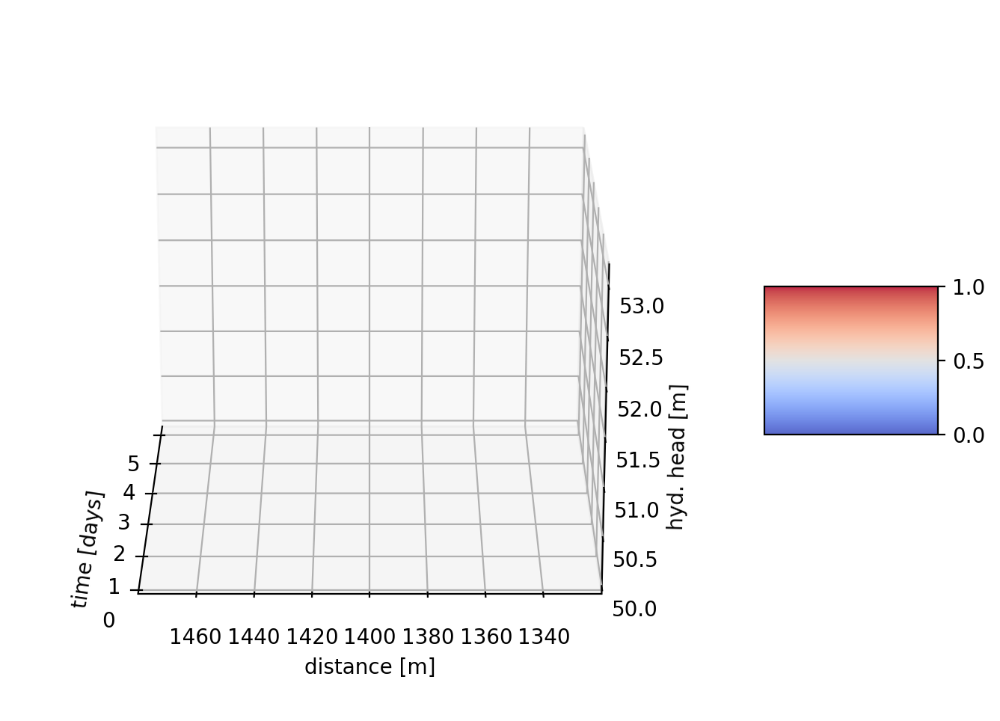

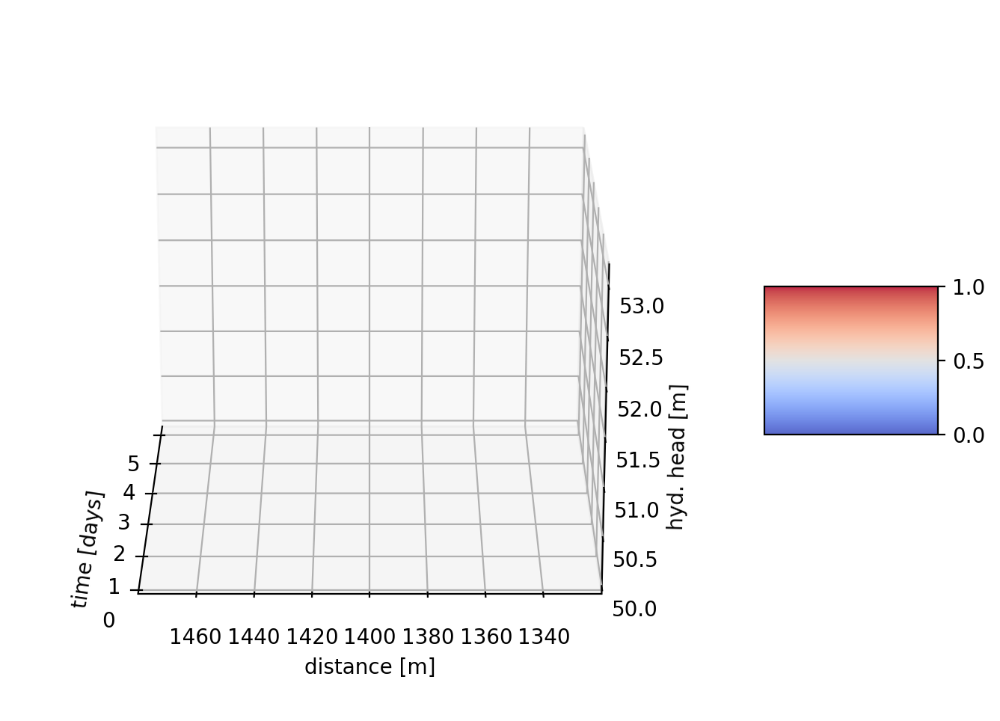

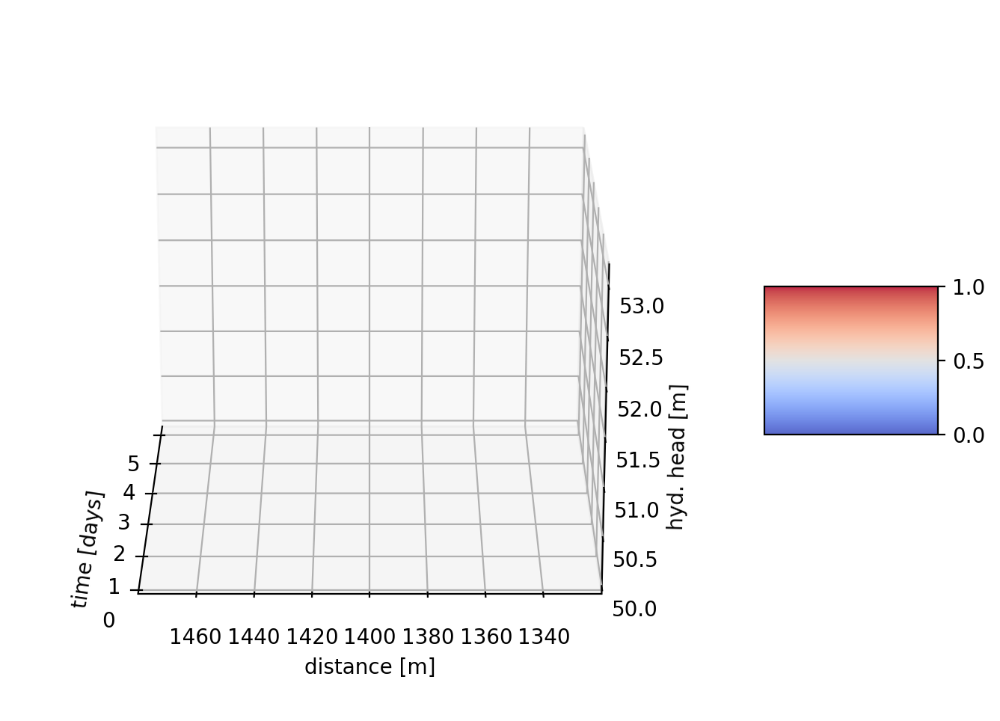

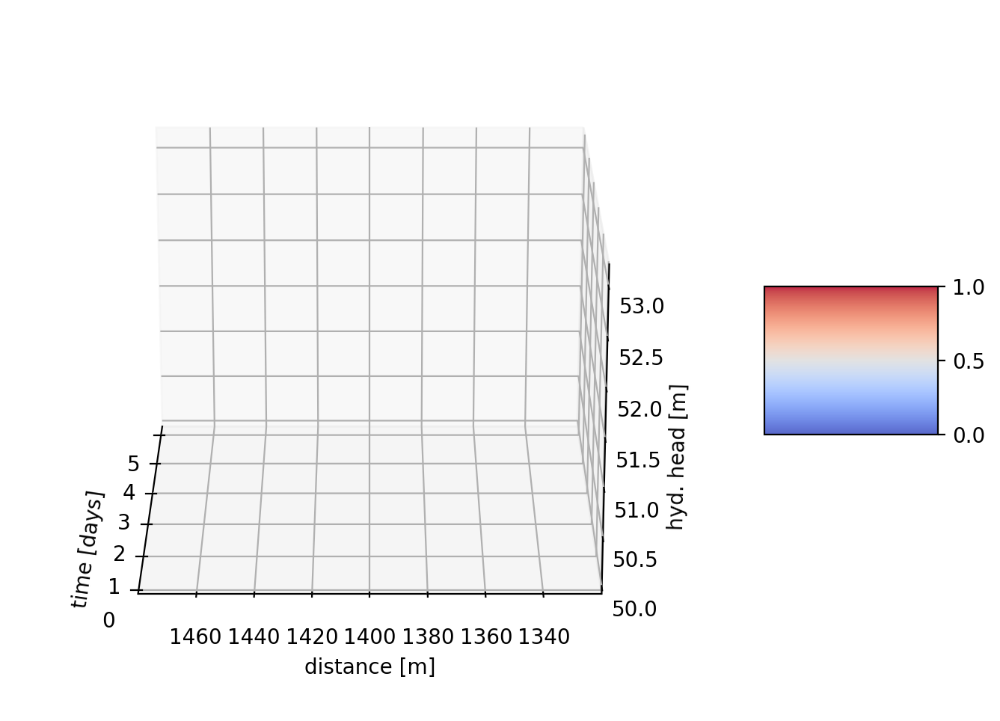

In [ ]:
solver_ivp() # create hFD values

In [ ]:
sol_ivp

In [ ]:
print( xi, h_a[0])

#### stand alone code for solver_ivp()
so the new solver can use the finite diff. method.

In [ ]:
ta= np.linspace(0.10, 3.30, 20)
solSo = solve_ivp(myodefun, [t0, tf], hI_vec,args=(x,xB,S,T,h0),t_eval=ta, method='LSODA',) #dense_output=True,vectorized=True, method='LSODA',[0][0]
# solSo is a bunch 

hFD =solSo["y"]
#hFD = hFD.astype('float')
t= solSo["t"]
if hasattr(solSo,'sol') is True:
    sol_ivp = solSo["sol"]
#print( hFD, t)

In [ ]:
ta= np.linspace(0.10, 3.30, 20)
solSo = solve_ivp(AnalyticalSol_6, [t0, tf], hI_vec,args=(xB, S,T,h0),t_eval=ta, method='LSODA',) #dense_output=True,vectorized=True, method='LSODA',[0][0]
# solSo is a bunch 

hFD =solSo["y"]
#hFD = hFD.astype('float')
t= solSo["t"]
if hasattr(solSo,'sol') is True:
    sol_ivp = solSo["sol"]
#print( hFD, t)

In [ ]:
solSo

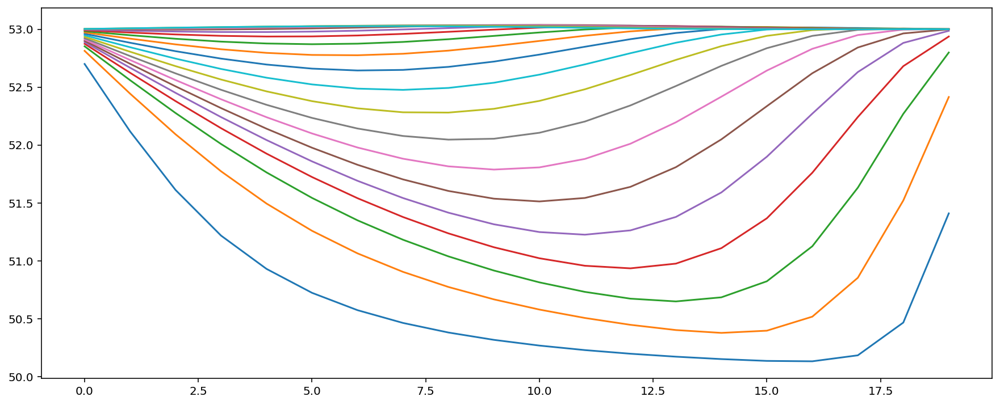

In [30]:
fig,ax= plt.subplots(figsize=(15,6) ) 
plt.plot( solSo.y, ); 

In [ ]:
sol_ivp_t =solSo.t; sol_ivp_t

In [25]:
hFD.shape

(20,)

In [31]:
import pandas as pd   # Create the dataframe
hFDdf = pd.DataFrame(hFD, )

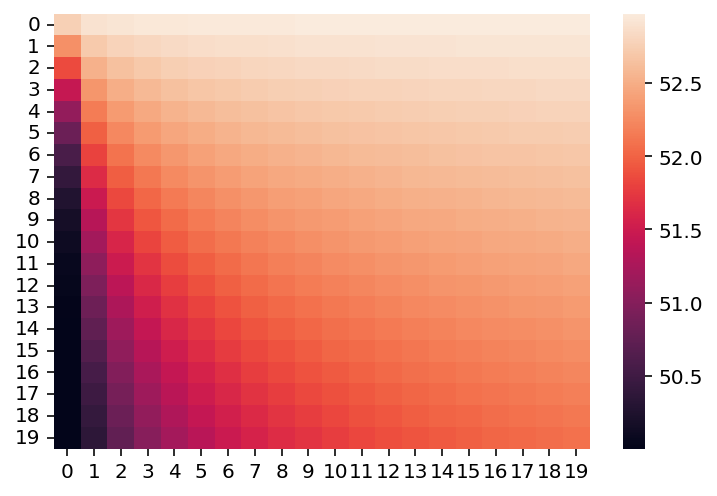

In [26]:
sns.heatmap( data=hdf);   # .flatten()x=t,y=t 

In [ ]:
sol_ivp

Of course we need to write the **ODE function** as well. 

### function MYodefun
This function calculates derivatives and contains also a function for the analytical solution.

In [32]:
from scipy import special

def myodefun(t,h,x,xB,S,T, h0): 
    """ 
    :param int  T: Transmissivity (m^2/day)
    :param float S: Storativity (-)
    :param int  hI: Initial hydraulic head (m)
    :param float  h0: Boundary head (m)
    :param int  x: location of points being solved for (m)
    :param int xB: location of finite difference block boundaries (m)
    :param float t: time (days)"""
    global Tdhdx0, dhdt, h_a
    
    # Calculate derivatives and include h=h0 at x=0 boundary condition
    difH =np.diff([h0, h], axis=0,)  
    difH= difH.ravel()
    #print("difH[0]:", difH[0]) # [0]
    difxB =np.diff([xB[0], x])
    difxB= difxB.ravel()
    #print("difxB",difxB, difxB.shape,difxB.dtype)
    dhdx = np.divide( difH, difxB)     #  difH / difxB 
    #print("dhdx",dhdx, dhdx.shape,)
    
    #  Calculate Darcy fluxes and include Q=0 at x=L boundary condition
    Tdhdx= -T* dhdx
    #print("Tdhdx",Tdhdx, Tdhdx.shape,)
    zeros20 =np.zeros( 20+1 )   #adapt to number of x parts , add 1 as dummy for 0
    
    Tdhdx0= Tdhdx.ravel()   #[0]  select first     .reshape(-1,1)     astype(float)
    #print("Tdhdx0",Tdhdx0, Tdhdx0.shape,Tdhdx0.dtype)
    #Q= np.array([Tdhdx0[0], 0.0 ],dtype='object')   
    Tdhdx0= Tdhdx0[0].flatten() 
    #Tdhdx0[19]= 0.0    # not 21 yet
    Tdhdx0= np.append( Tdhdx0, 0) # 0.
    #print("Tdhdx0[19]:",Tdhdx0[19]  )  #
    #print("Tdhdx0",Tdhdx0, Tdhdx0.shape,Tdhdx0.dtype, type(Tdhdx0))
    Q= Tdhdx0
    
    # Calculate the flux divergence
    dQdx=  np.diff(Q )/ np.diff(xB )  #  np.divide( np.diff(Q ), np.diff(xB ))
    #print('dQdx', dQdx)
    # Solve the mass conservation statement
    dhdt= -dQdx/S
    
    def AnalyticalSol(t,x,S,T,hI,h0):
        global tt,xx, h, u, Q_edel
        """
        :params u: u via Edelman solution h(x,t)= delta_h* erfc(u)
        :params Q_edel: flux via Edelman solution"""
        #print("t" ,t,"x",x )
        tt,xx= np.meshgrid(ta,x, )    # sparse=True[0:7][0:7]
        #if  tt.any()!=np.nan :  # xx.all() >=0 and
        h= (h0-hI)* special.erfc(np.sqrt( S*xx**2/4/T/tt)) + hI      #  S/T * x²/t *1/4  as  ∫ S/T * x/t *1/2 
        delh= (h0-hI)
        u= np.sqrt( S*xx**2/4/T/tt)
        Q_edel= T* delh * 2 * u / (x * np.sqrt(np.pi)) * np.exp(-u** 2) 
        #else:     #    h= (h0-hI) + hI
        #sns.lineplot(x=t.flatten ,y=h.flatten ,  ) #data=h,label="heads over timespan {}" % t ,x=t.flatten ,y=h.flatten ,h(20, 20)
        #hdf = h.T 
        fig = plt.figure(figsize=( 10,6))
        ax = fig.add_subplot(111, projection='3d', )
        surf= ax.plot_surface(tt[::-1], xx[::-1], h, cmap="coolwarm", linewidth=0.1, antialiased=False, alpha=0.85) # hdf
        fig.colorbar(surf, shrink=0.85, aspect=0.85)
        ax.set_xlim(0, 5.2);  
        ax.set_zlim(50, 53.15)
        ax.set( xlabel='time [days]', ylabel='distance [m]', zlabel='hyd. head [m]',  ) #       zticks=[0, -150, -300, -450],
        # Set distance and angle view
        ax.view_init(20, 180, 'z')   # "y"
        ax.dist = 10

        return h  
        
    # Evaluate analytical solution
    h_a= AnalyticalSol(ta,x,S,T,hI,h0)
    # Plot results and compare with the analytical solution    
    #fig,ax = plt.subplots(1,1, figsize= (8,4) )      
     #convert x to int
    #xi= np.array( x, dtype='int')
    #print("xi:",xi ,"h_a[0]:", h_a[0] ,"ta",ta)
    #ax.plot(xi.astype(int) ,h_a[0] ,  label="heads pt.1")  # [0] sns.linedata=h_a[0], ax=ax[1]
    #ax.plot(xi.astype(int) ,h_a[10] , label="heads pt.11")    # data=h_a[10],, ax=ax
    #ax.plot(xi.astype(int) ,h_a[19] , label="heads pt.20")   #data=h_a[19],, ax=ax
    #ax.set_xlabel('Distance (m)')
    #ax.set_ylabel('Hydraulic head (m)')
    #ax.grid(True) ; plt.suptitle(f"t:{ta}", horizontalalignment='right') ; 
    #ax.legend()
    #sns.lineplot(x= ta ,y= hFD, label="", ax=ax[1])  #  [0:12]
    #ax[1].plot(ta ,hFD , label="h Fin.Diff.")
    #ax[1].set_xlabel('time')
    #ax[1].set_ylabel('Hydraulic head (m)'); plt.xlim(0,3000)
    #plt.legend(['0 days (analytical)','0.1 days (analytical)','1 days (analytical)','10 days (analytical)','100 days (analytical)','0 days (finite difference)','0.1 days (finite difference)','1 days (finite difference)','10 days (finite difference)','100 days (finite difference)'])
    
    return dhdt

In [48]:
h[0]

array([52.76103298, 52.80304448, 52.82861781, 52.8462694 , 52.85939305,
       52.86964332, 52.8779358 , 52.8848236 , 52.89066321, 52.89569609,
       52.90009236, 52.90397583, 52.90743901, 52.91055264, 52.9133718 ,
       52.91594018, 52.91829287, 52.92045847, 52.92246053, 52.92431864])

In [49]:
hdf =pd.DataFrame( h); hdf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,52.761033,52.803044,52.828618,52.846269,52.859393,52.869643,52.877936,52.884824,52.890663,52.895696,52.900092,52.903976,52.907439,52.910553,52.913372,52.915940,52.918293,52.920458,52.922461,52.924319
1,52.292531,52.414431,52.489350,52.541334,52.580113,52.610472,52.635074,52.655535,52.672900,52.687879,52.700972,52.712545,52.722870,52.732157,52.740569,52.748235,52.755259,52.761726,52.767707,52.773258
2,51.851225,52.041288,52.160358,52.243853,52.306556,52.355871,52.395972,52.429410,52.457846,52.482416,52.503922,52.522953,52.539949,52.555249,52.569118,52.581766,52.593361,52.604042,52.613924,52.623101
3,51.451782,51.692572,51.847807,51.958393,52.042277,52.108711,52.163007,52.208459,52.247233,52.280818,52.310276,52.336388,52.359743,52.380795,52.399899,52.417337,52.433338,52.448090,52.461747,52.474438
4,51.104361,51.375391,51.556901,51.688950,51.790461,51.871603,51.938372,51.994556,52.042683,52.084508,52.121295,52.153979,52.183271,52.209718,52.233754,52.255723,52.275905,52.294530,52.311789,52.327840


In [21]:
from scipy.interpolate import Akima1DInterpolator 
import numpy as np
  
# defining polynomial function
var = np.poly1d([S/4/T/tt[0][0], 0, 0])
print("Polynomial function, f(x):\n", var)
# calculating the derivative
derivative = var.deriv()
print("Derivative, f(x)'=", derivative)
# calculates the derivative of after # given value of x
print("When x=5  f(x)'=", derivative(800))
#Akima1DInterpolator.derivative(S*xx**2/4/T/tt)

Polynomial function, f(x):
           2
4.13e-10 x
Derivative, f(x)'=  
8.261e-10 x
When x=5  f(x)'= 6.608623263102572e-07


In [112]:
tt[-1]

array([ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
        3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
        5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
        8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ])

In [114]:
x[0:19]

array([  40.,  120.,  200.,  280.,  360.,  440.,  520.,  600.,  680.,
        760.,  840.,  920., 1000., 1080., 1160., 1240., 1320., 1400.,
       1480.])

In [115]:
hFD

array([  50.        ,  131.73130194,  212.71468144,  292.9501385 ,
        372.43767313,  451.17728532,  529.16897507,  606.41274238,
        682.90858726,  758.6565097 ,  833.6565097 ,  907.90858726,
        981.41274238, 1054.16897507, 1126.17728532, 1197.43767313,
       1267.9501385 , 1337.71468144, 1406.73130194, 1475.        ])

In [ ]:
myodefun(ta,h,x,xB,S,T,h0)

In [14]:
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)  

hFD: [  50.          141.42645429  231.94792244  321.56440443  410.27590028
  498.08240997  584.98393352  670.98047091  756.07202216  840.25858726
  923.5401662  1005.916759   1087.38836565 1167.95498615 1247.6166205
 1326.3732687  1404.22493075 1481.17160665 1557.2132964  1632.35      ] t: [  50.          507.13227147  959.73961219 1407.82202216 1851.37950138
 2290.41204986 2724.91966759 3154.90235457 3580.3601108  4001.29293629
 4417.70083102 4829.58379501 5236.94182825 5639.77493075 6038.08310249
 6431.86634349 6821.12465374 7205.85803324 7586.06648199 7961.75      ]


(array([  50.        ,  507.13227147,  959.73961219, 1407.82202216,
        1851.37950138, 2290.41204986, 2724.91966759, 3154.90235457,
        3580.3601108 , 4001.29293629, 4417.70083102, 4829.58379501,
        5236.94182825, 5639.77493075, 6038.08310249, 6431.86634349,
        6821.12465374, 7205.85803324, 7586.06648199, 7961.75      ]),
 array([  50.        ,  141.42645429,  231.94792244,  321.56440443,
         410.27590028,  498.08240997,  584.98393352,  670.98047091,
         756.07202216,  840.25858726,  923.5401662 , 1005.916759  ,
        1087.38836565, 1167.95498615, 1247.6166205 , 1326.3732687 ,
        1404.22493075, 1481.17160665, 1557.2132964 , 1632.35      ]))

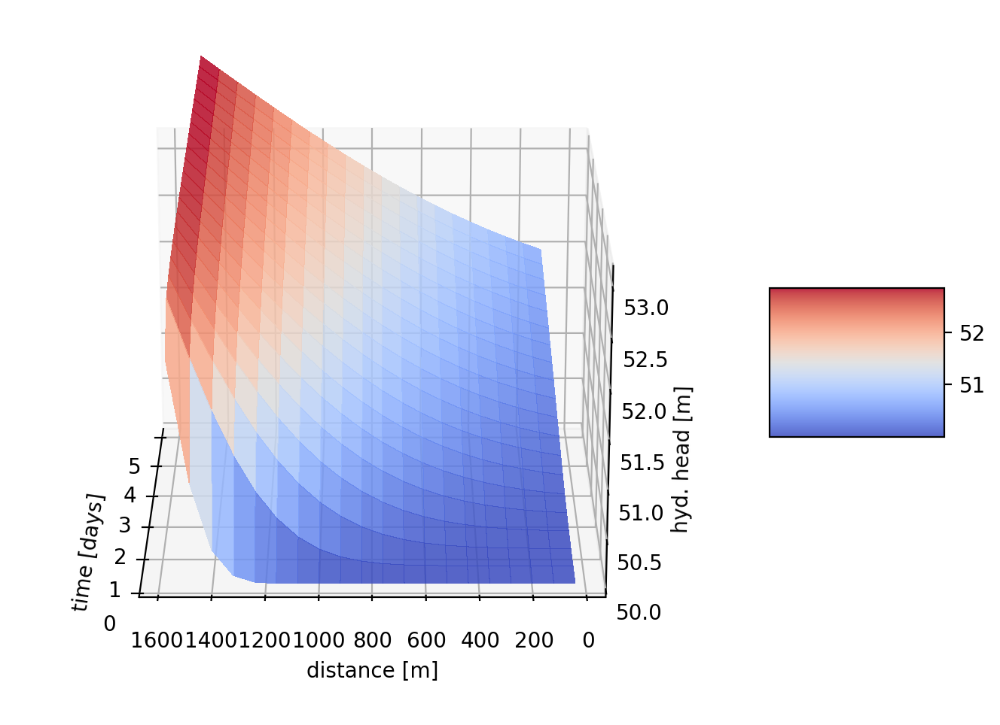

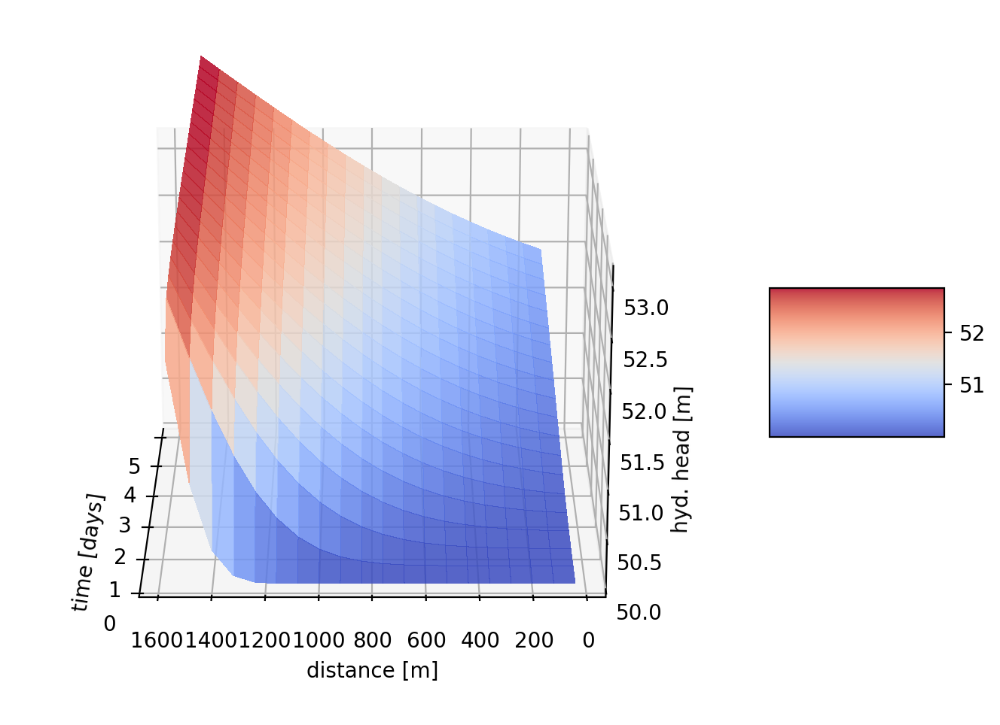

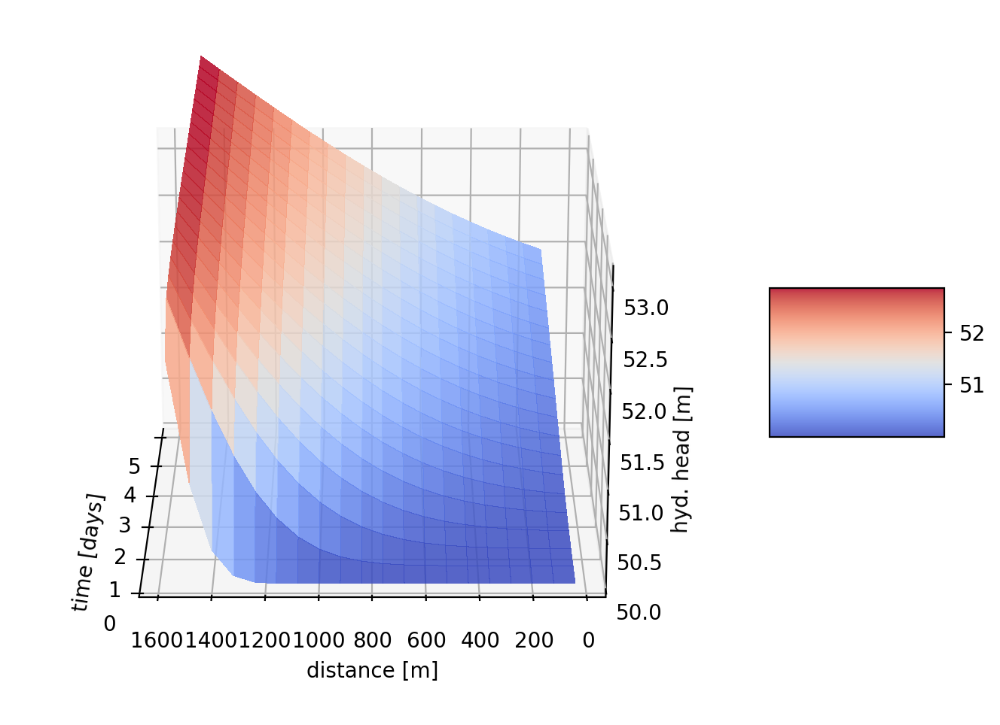

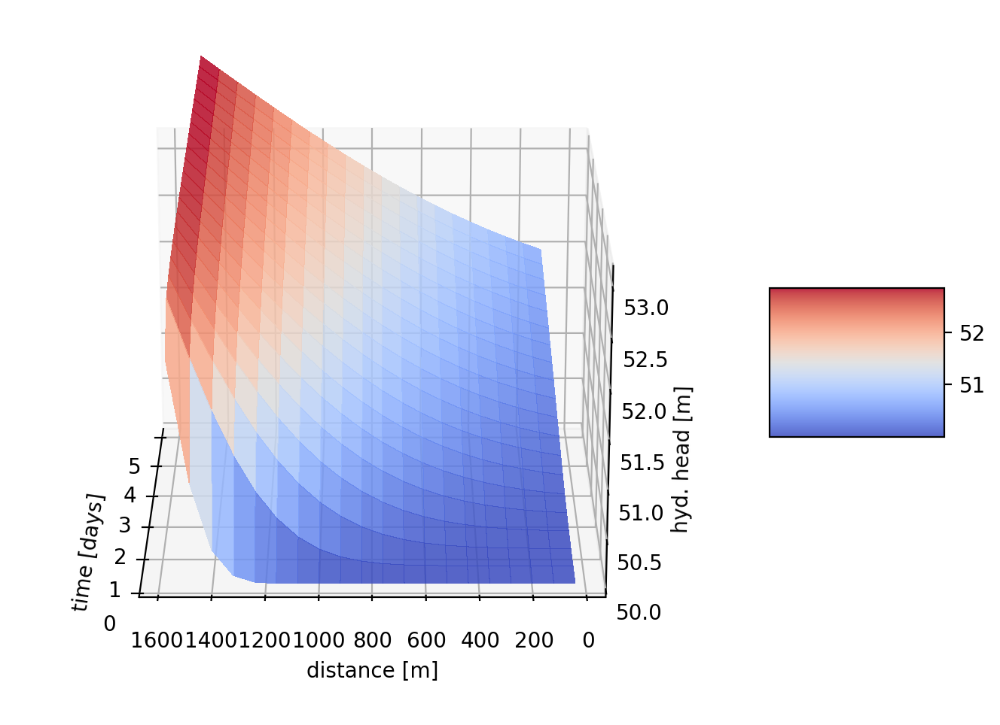

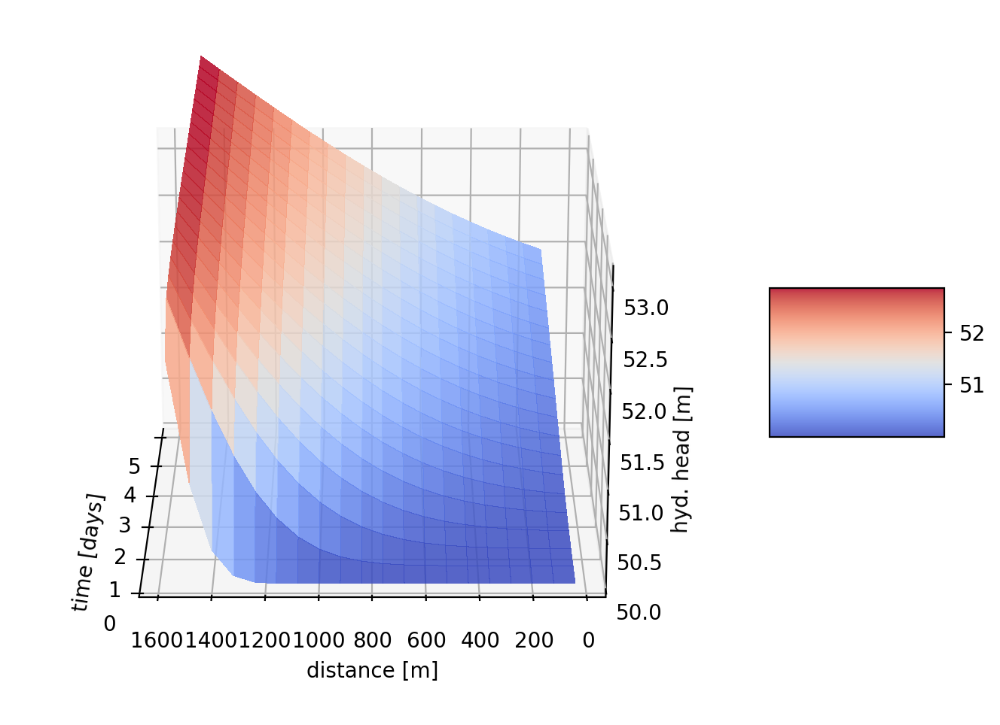

...

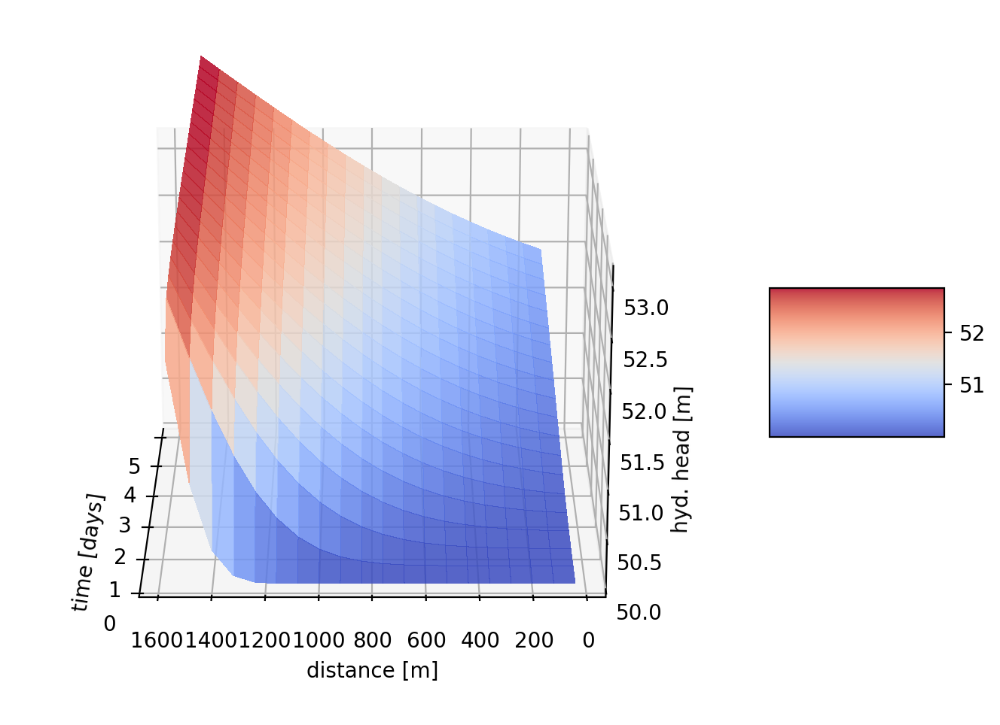

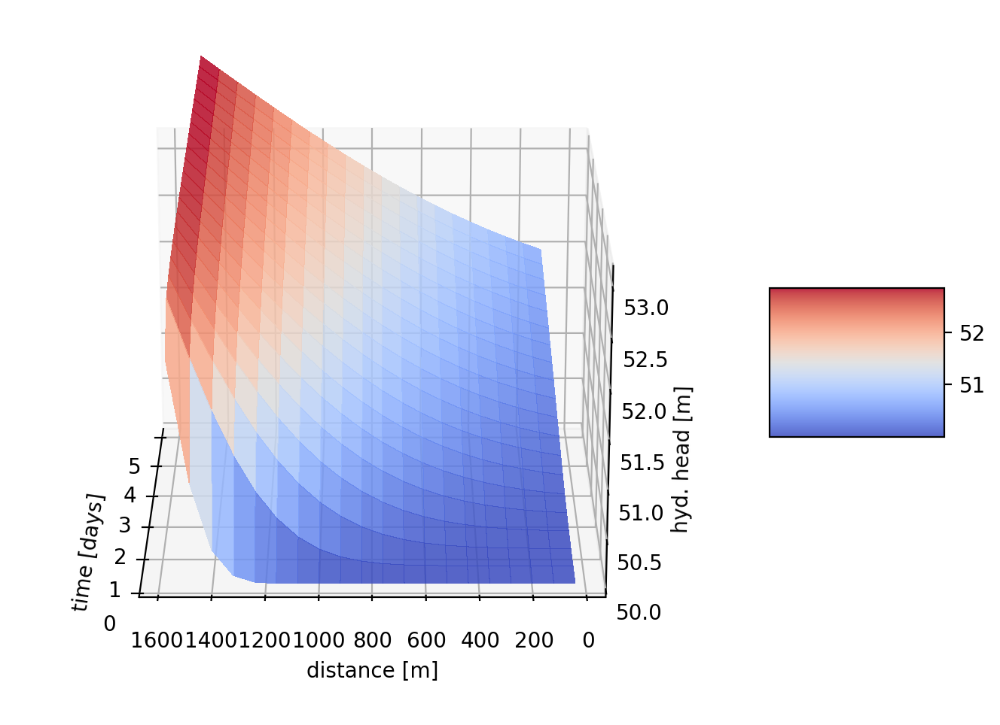

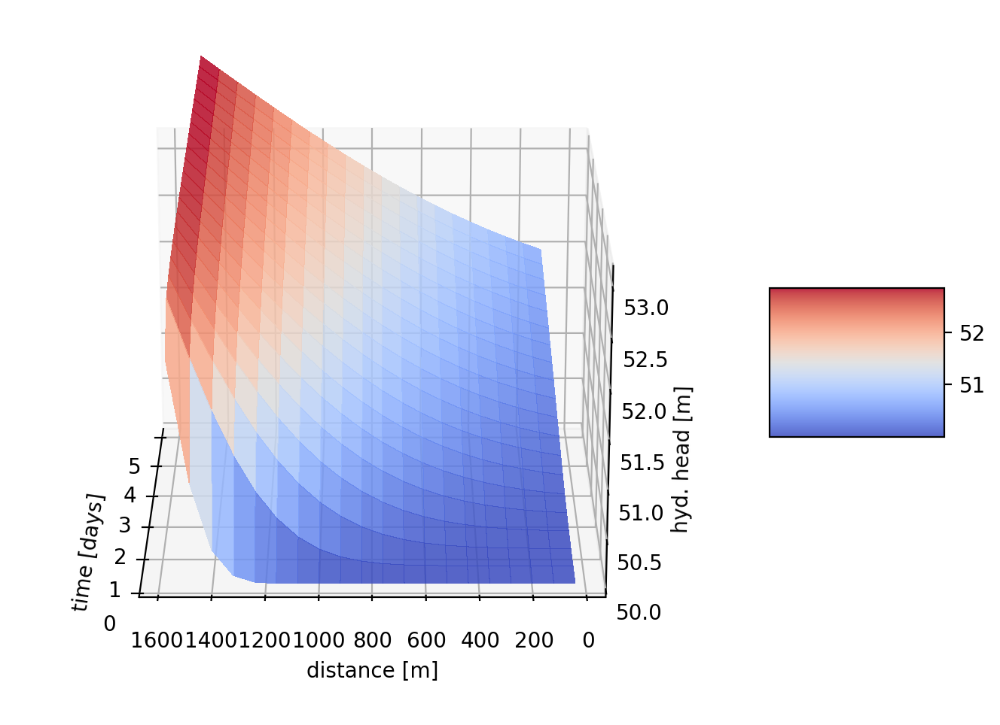

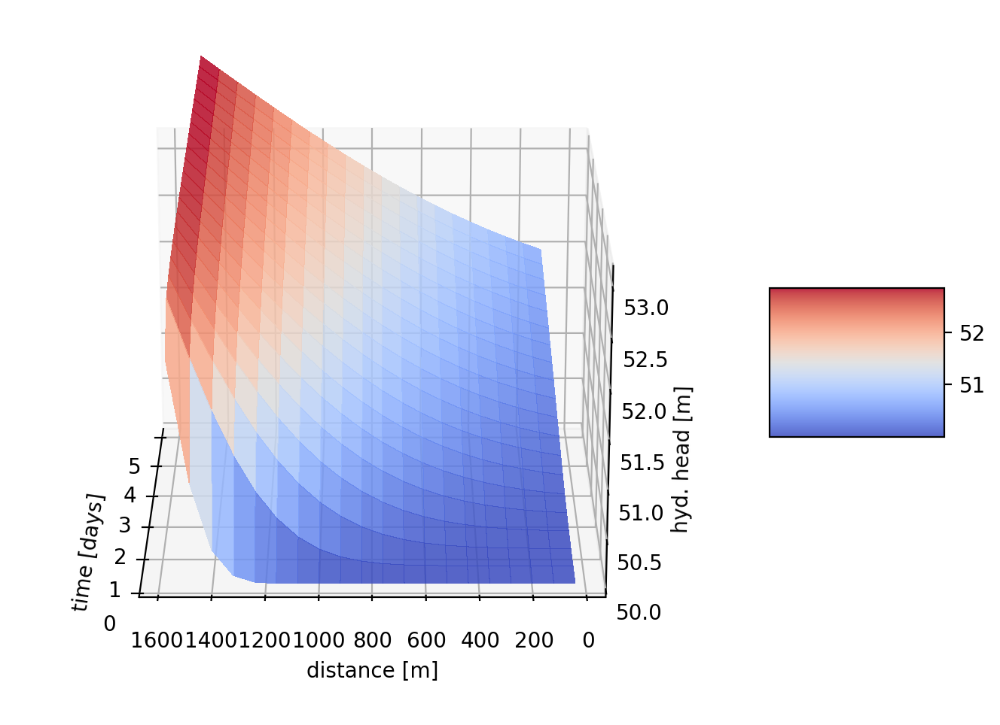

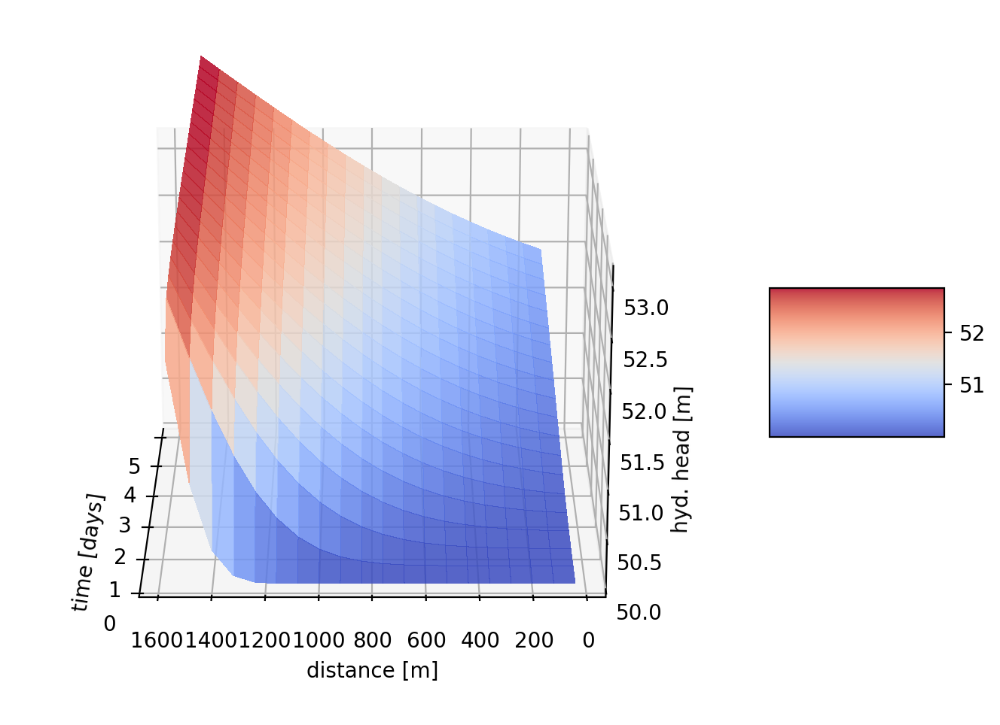

In [42]:
onedimex("odeint") #  ""

In [ ]:
onedimex( ) 

TypeError: onedimex() missing 1 required positional argument: 'solver'

In [43]:
print( x, h_a[0], Q_edel.shape )

[  40.  120.  200.  280.  360.  440.  520.  600.  680.  760.  840.  920.
 1000. 1080. 1160. 1240. 1320. 1400. 1480. 1560.] [52.2554889  52.69707656 52.77634693 52.81457874 52.83816115 52.85455826
 52.86680633 52.87640383 52.88418678 52.89066321 52.89616202 52.90090674
 52.90505534 52.90872303 52.91199607 52.91494051 52.9176079  52.92003912
 52.92226709 52.92431864] (20, 20)


In [16]:
h.dtype

dtype('float64')

In [17]:
print( hI_vec, ta)

[50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50.] [ 0.1         0.62105263  1.14210526  1.66315789  2.18421053  2.70526316
  3.22631579  3.74736842  4.26842105  4.78947368  5.31052632  5.83157895
  6.35263158  6.87368421  7.39473684  7.91578947  8.43684211  8.95789474
  9.47894737 10.        ]


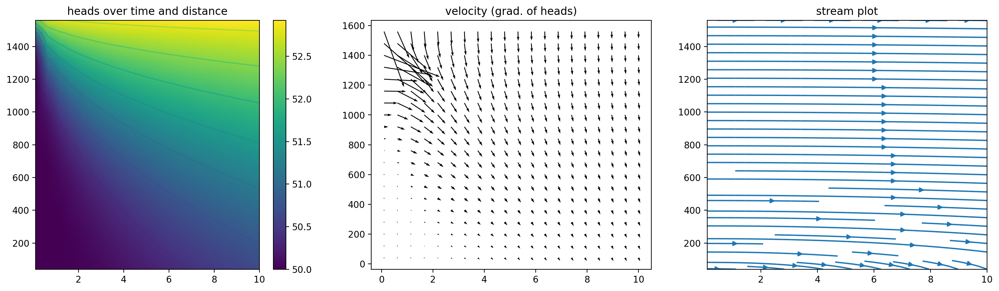

In [29]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(19, 5))
m = ax1.pcolormesh(tt[::-1], xx[::-1], h, shading='Gouraud')
ax1.contour(tt[::-1], xx[::-1], h,)
plt.colorbar(m, ax=ax1) #ax1.axis('equal')
ax1.set_title("heads over time and distance");

u, v = np.gradient(h)
ax2.quiver(tt[::-1], xx[::-1], v, u) # X, Y, v, u
ax2.set_title("velocity (grad. of heads)"); #ax2.axis('equal') #ax3.quiver(tt, xx, u, v)
ax3.streamplot(tt, xx, v, u); ax3.set_title('stream plot'); 

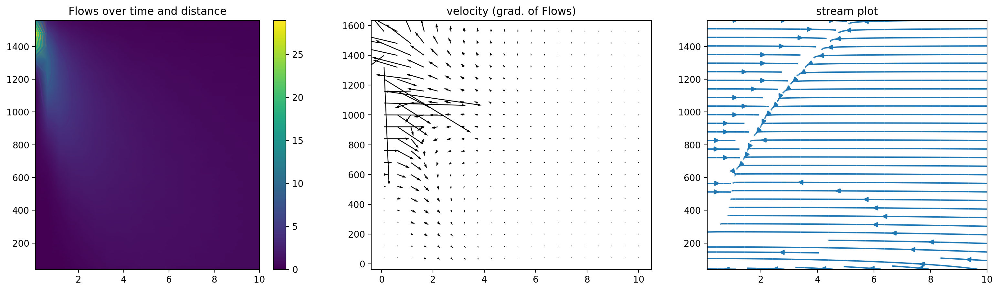

In [30]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(19, 5))
m = ax1.pcolormesh(tt[::-1], xx[::-1], Q_edel, shading='Gouraud')
ax1.contour(tt[::-1], xx[::-1], Q_edel,)
plt.colorbar(m, ax=ax1) #ax1.axis('equal')
ax1.set_title("Flows over time and distance");

u, v = np.gradient(Q_edel)
ax2.quiver(tt[::-1], xx[::-1], v, u) # X, Y, v, u
ax2.set_title("velocity (grad. of Flows)"); #ax2.axis('equal') #ax3.quiver(tt, xx, u, v)
ax3.streamplot(tt, xx, v, u); ax3.set_title('stream plot'); 

### Analytical solution

In [31]:
import pandas as pd
an_solution= pd.DataFrame( h_a )


### 3D surface subplots

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=1, cols=2, specs=[[{'type': 'surface'}, {'type': 'surface'}],
           ]) # [{'type': 'surface'}, {'type': 'surface'}]

x = x  #np.linspace(-5, 80, 10)
y = ta #np.linspace(-5, 60, 10)
#xGrid, yGrid = np.meshgrid(y, x)
#z = xGrid ** 3 + yGrid ** 3
z1= an_solution.iloc[:,1].values; z3= an_solution.iloc[:,3].values; 
z7= an_solution.iloc[:,7].values; z11= an_solution #.iloc[:,11].values

# adding surfaces to subplots
fig.add_trace(
    go.Surface(x=x, y=y[::-1], z=h_a, colorscale='Viridis', showscale=True,),
    row=1, col=1, )
fig.add_trace(
    go.Surface(x=x, y=y[::-1], z=z11, colorscale='YlOrRd', showscale=False), #z=h
    row=1, col=2)
#fig.add_trace(
#    go.Surface(x=x, y=y, z=z7, colorscale='YlOrRd', showscale=False),
#    row=2, col=1)
#fig.add_trace(
#    go.Surface(x=x, y=y, z=z11, colorscale='YlGnBu', showscale=False),
#    row=2, col=2)

fig.update_layout(
    title_text='3D subplots hydrol. heads solution',
    height=800,  width=1200, xaxis_title="Distance $m$", yaxis_title="Time", # zaxis_title="Hyd. Heads",
    legend_title="Groundwater table - sudden hydr. head increase",  )
#fig.update_scenes(camera_center=dict(x=1, y=1, z=1))
fig.update_scenes(camera_eye=dict(x=1.10, y=1.30, z=1.75))
fig.update_scenes(aspectratio=dict(x=1.10, y=1.30, z=1.0))
fig.show() 

In [57]:
fig.write_html( "Groundwater table - sudden hydr. head increase.html") 

In [20]:
an_solution.iloc[:,11].values

array([52.90090674, 52.70339836, 52.50791054, 52.31574449, 52.1281343 ,
       51.9462233 , 51.77104339, 51.60349803, 51.44434925, 51.29420905,
       51.15353516, 51.02263122, 50.90165088, 50.79060572, 50.68937618,
       50.59772509, 50.51531301, 50.44171487, 50.37643706, 50.3189345 ])

In [21]:
an_solution.iloc[:,3]

0     52.814579
1     52.448160
2     52.094699
3     51.761825
4     51.455772
5     51.181053
6     50.940310
7     50.734342
8     50.562307
9     50.422022
10    50.310341
11    50.223539
12    50.157675
13    50.108883
14    50.073595
15    50.048679
16    50.031504
17    50.019946
18    50.012352
19    50.007481
Name: 3, dtype: float64

In [22]:
ta

array([ 0.1       ,  0.62105263,  1.14210526,  1.66315789,  2.18421053,
        2.70526316,  3.22631579,  3.74736842,  4.26842105,  4.78947368,
        5.31052632,  5.83157895,  6.35263158,  6.87368421,  7.39473684,
        7.91578947,  8.43684211,  8.95789474,  9.47894737, 10.        ])

In [32]:
dhdx_ = np.diff([h0,51]) /np.diff( [xB[0],51])
np.array([dhdx_[0] ,0] ,dtype='object') 

array([-0.0392156862745098, 0], dtype=object)

In [23]:
print(x[0:2], ta[0:2], h.shape, h[0:2])

[ 40. 120.] [0.1        0.62105263] (20, 20) [[52.2554889  52.69707656 52.77634693 52.81457874 52.83816115 52.85455826
  52.86680633 52.87640383 52.88418678 52.89066321 52.89616202 52.90090674
  52.90505534 52.90872303 52.91199607 52.91494051 52.9176079  52.92003912
  52.92226709 52.92431864]
 [51.02834513 52.11032801 52.33678319 52.44816017 52.51742924 52.56581472
  52.60206354 52.63052611 52.65364226 52.67290024 52.68926622 52.70339836
  52.71576259 52.72669922 52.73646338 52.74525063 52.75321372 52.76047389
  52.76712884 52.77325824]]


In [24]:
print(h0, xB[1])

53.0 80.0


In [25]:
x[1]

120.0

In [26]:
print(tt[0],xx[0] )

[ 0.1         0.62105263  1.14210526  1.66315789  2.18421053  2.70526316
  3.22631579  3.74736842  4.26842105  4.78947368  5.31052632  5.83157895
  6.35263158  6.87368421  7.39473684  7.91578947  8.43684211  8.95789474
  9.47894737 10.        ] [40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40. 40.
 40. 40.]


In [63]:
xB[0:2]

array([ 0., 80.])

##### meshgrid test

In [123]:
x3 = np.array([1, 2, 3]); y3 = np.array([10, 20, 30]) 
XX, YY = np.meshgrid(x3, y3, ) #sparse
XX

array([[1, 2, 3],
       [1, 2, 3],
       [1, 2, 3]])

In [124]:
YY

array([[10, 10, 10],
       [20, 20, 20],
       [30, 30, 30]])

In [125]:
XX, YY

(array([[1, 2, 3],
        [1, 2, 3],
        [1, 2, 3]]),
 array([[10, 10, 10],
        [20, 20, 20],
        [30, 30, 30]]))

In [169]:
YY, XX = np.mgrid[10:40:10, 1:4]; ZZ = XX + YY; ZZ

array([[11, 12, 13],
       [21, 22, 23],
       [31, 32, 33]])

In [176]:
difH_ =np.diff([10,50,100])  # ex np.diff([xB[1],x])
print("difH_",difH_)
difxB_ =np.diff([40,30,2])
print("difxB_",difxB_)
dhdx___ = np.divide( difH_ , difxB_) 
dhdx___

difH_ [40 50]
difxB_ [-10 -28]


array([-4.        , -1.78571429])

Most of the above code in the ODE function is self-explanatory. However, pay close attention to how the boundary conditions are applied.

The fixed head boundary, associated with the lake, is applied by concatenating the boundary head, h0, and its associated location, xB(1), to the h and x vectors, respectively, prior to finding the derivatives, .

The zero flux boundary, associated with the fault zone, is applied by simply concatenating a zero to the Q vector.

## Plotting the results and comparing to an analytical solution

Whenever developing numerical models it is always important to study your results and try to compare these to analytical solutions where possible.

The problem being solved here has an analytical solution for the special case where . Our finite difference model should produce very similar results to the analytical solution until the pressure wave hits the bounday at .

The analytical solution takes the form 

<img src="steady-flow-in-an-unconfined-aquifer-l.jpg"  width="600" embed="True"/>

Add the following subfunction to your script-file, which contains an implementation of the analytical solution.

In [ ]:
def AnalyticalSol_6(ta,x,S,T,hI,h0):
    #  Add the following code to the main function in your script-file to
    #  evaluate the analytical solution and generate a plot comparing the results
    #  from both the analytical and finite difference solutions.
    t_,x_= np.meshgrid(ta,x)
    h= (h0-hI)* special.erfc(np.sqrt( S*x_**2/4/T/t_)) + hI
    
    return h

### Animation of  hydraulic heads over time

In [164]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

tt,xx= np.meshgrid(ta,x)
h_= (h0-hI)* special.erfc(np.sqrt( S*xx**2/4/T/tt)) + hI  # 
h_d= pd.DataFrame( h_)  #np.flip(h_)
h__= h_d[ h_d.columns[::-1]]
# Reverse rows using iloc()
h__ = h__.iloc[::-1]
h__.head()

,19,18,17,16,15,14,13,12,11,10,9,8,7,6,5,4,3,2,1,0
19,50.652405,50.615754,50.577671,50.538120,50.497082,50.454564,50.410614,50.365339,50.318934,50.271725,50.224222,50.177202,50.131821,50.089735,50.053198,50.024955,50.007481,50.000789,50.000002,50.0
18,50.725951,50.688357,50.649121,50.608170,50.565442,50.520891,50.474504,50.426316,50.376437,50.325096,50.272702,50.219934,50.167882,50.118221,50.073431,50.036887,50.012352,50.001608,50.000008,50.0
17,50.805145,50.766853,50.726721,50.684639,50.640497,50.594196,50.545653,50.494822,50.441715,50.386442,50.329276,50.270749,50.211807,50.154043,50.100021,50.053623,50.019946,50.003170,50.000027,50.0
16,50.890079,50.851363,50.810626,50.767720,50.722489,50.674775,50.624426,50.571305,50.515313,50.456425,50.394747,50.330612,50.264745,50.198534,50.134453,50.076669,50.031504,50.006048,50.000085,50.0
15,50.980805,50.941964,50.900944,50.857558,50.811607,50.762874,50.711133,50.656156,50.597725,50.535664,50.469884,50.400476,50.327868,50.253112,50.178385,50.107832,50.048679,50.011169,50.000251,50.0


In [1]:
from matplotlib.animation import PillowWriter

In [176]:
fig, ax = plt.subplots()
def update(n):  # n
    #t = np.linspace(0, 2 * np.pi, num=n, endpoint=False) #x.tolist()
    if n>0 and n <=20:
        sns.lineplot(x=x, y= h__.iloc[n,0:20],data= h__.iloc[n,0:20], ax=ax,label=f"t={round(tt[n,n],1)}" ); #x=x,y= h__[n,0:19], #label=f"t={round(tt[n,n],2)},n={n}" .flat
        ax.set_ylim(50,53); ax.grid(True)
        ax.legend(bbox_to_anchor=(0.95, 0.95))
        ax.set_xlabel('meters')
        ax.set_ylabel('Heads')
    else: 
        #print(n)
        pass

anim = FuncAnimation(fig, update, frames=range(0, 20, 1), repeat=False)
anim.save('animation_1D_heads_over_20_times.gif') # MovieWriter ffmpeg unavailable; using Pillow instead.
plt.close()
HTML(anim.to_jshtml())

MovieWriter ffmpeg unavailable; using Pillow instead.


0
0
0
0


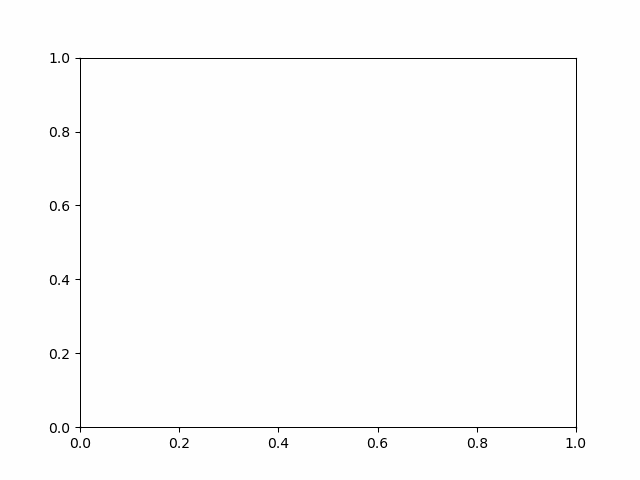

In [8]:
from IPython.display import Image
Image("animation_1D_heads_over_20_times.gif", embed=True, unconfined=True, width=1200, height=1000, retina=True)

In [177]:
h__.iloc[0,0:20]

19    50.652405
18    50.615754
17    50.577671
16    50.538120
15    50.497082
14    50.454564
13    50.410614
12    50.365339
11    50.318934
10    50.271725
9     50.224222
8     50.177202
7     50.131821
6     50.089735
5     50.053198
4     50.024955
3     50.007481
2     50.000789
1     50.000002
0     50.000000
Name: 19, dtype: float64

In [133]:
h__[0,:]

array([50.65240468, 50.615754  , 50.57767139, 50.53812045, 50.49708209,
       50.45456389, 50.41061358, 50.36533864, 50.3189345 , 50.27172522,
       50.22422158, 50.1772022 , 50.13182137, 50.08973532, 50.05319785,
       50.02495515, 50.00748092, 50.00078882, 50.00000224, 50.        ])

In [57]:
zz = np.sqrt(tt**2 + xx**2)

In [151]:
print(x, len(x),x.tolist()  )

[  40.  120.  200.  280.  360.  440.  520.  600.  680.  760.  840.  920.
 1000. 1080. 1160. 1240. 1320. 1400. 1480. 1560.] 20 [40.0, 120.0, 200.0, 280.0, 360.0, 440.0, 520.0, 600.0, 680.0, 760.0, 840.0, 920.0, 1000.0, 1080.0, 1160.0, 1240.0, 1320.0, 1400.0, 1480.0, 1560.0]


In [18]:
tt.shape #,xx

(20, 20)

In [62]:
t

array([   50.   ,  2660.873,  5111.034,  7400.485,  9529.224, 11497.253,
       13304.571, 14951.177, 16437.073, 17762.258, 18926.731, 19930.494,
       20773.546, 21455.886, 21977.516, 22338.435, 22538.643, 22578.139,
       22456.925, 22175.   ])

In [ ]:
xx

In [ ]:
tt,xx

In [176]:
np.logspace(-3,0,N)*L

array([   1.6       ,    2.30151982,    3.31062093,    4.76216231,
          6.85013184,    9.85357138,   14.17386865,   20.38839977,
         29.32769137,   42.18641438,   60.68304305,   87.2895165 ,
        125.56159526,  180.61406267,  259.80427827,  373.71543505,
        537.57092581,  773.26883817, 1112.30847388, 1600.        ])

In [35]:
print(tt.shape, hFD.shape, Tdhdx0.shape)

(20, 20) (20,) (21,)


In [34]:
tt.shape

(20, 20)

In [39]:
tt[5:7]

array([[ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
         3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
         5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
         8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ],
       [ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
         3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
         5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
         8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ]])

### DataFrame composition

In [35]:
import pandas as pd
df= pd.DataFrame()   # T,S, L, hI, h0 ,
df.index= np.arange (1,20)
print( len(x),  len(xB), len(ta), len(hFD) )
df["x"]= x[0:19].ravel() ; 
df["xB"]= xB[0:19].ravel() ; #df.iloc[0:4]["t"]= t; 
df["tt5"]= tt[5,0:19]; # 
df["tt10"]= tt[10,0:19]; df["tt15"]= tt[15,0:19]; # # 
df["hFD"]= hFD[0:19].ravel()
df["Q"]= Tdhdx0[0:19].ravel() 
df["dhdt"]= dhdt[0:19].ravel()

20 21 20 20


In [28]:
df["t_day"]=df["tt5"]/86400

In [29]:
df.head()

,x,xB,tt5,tt10,hFD,Q,dhdt,t_day
1,40.0,0.0,0.100000,0.100000,50.000000,739.413143,616.177620,0.000001
2,120.0,80.0,0.621053,0.621053,141.426454,246.471048,123.235524,0.000007
3,200.0,160.0,1.142105,1.142105,231.947922,147.882629,52.815225,0.000013
4,280.0,240.0,1.663158,1.663158,321.564404,105.630449,29.341791,0.000019
5,360.0,320.0,2.184211,2.184211,410.275900,82.157016,18.672049,0.000025


In [36]:
df[["tt5","tt10", "tt15","dhdt","x"]].head()

,tt5,tt10,tt15,dhdt,x
1,0.100000,0.100000,0.100000,616.177620,40.0
2,0.621053,0.621053,0.621053,123.235524,120.0
3,1.142105,1.142105,1.142105,52.815225,200.0
4,1.663158,1.663158,1.663158,29.341791,280.0
5,2.184211,2.184211,2.184211,18.672049,360.0


In [66]:
x

array([  40.,  120.,  200.,  280.,  360.,  440.,  520.,  600.,  680.,
        760.,  840.,  920., 1000., 1080., 1160., 1240., 1320., 1400.,
       1480., 1560.])

In [141]:
hFD

array([  50.        ,  131.73130194,  212.71468144,  292.9501385 ,
        372.43767313,  451.17728532,  529.16897507,  606.41274238,
        682.90858726,  758.6565097 ,  833.6565097 ,  907.90858726,
        981.41274238, 1054.16897507, 1126.17728532, 1197.43767313,
       1267.9501385 , 1337.71468144, 1406.73130194, 1475.        ])

In [45]:
reversed_tt = np.flip(tt)

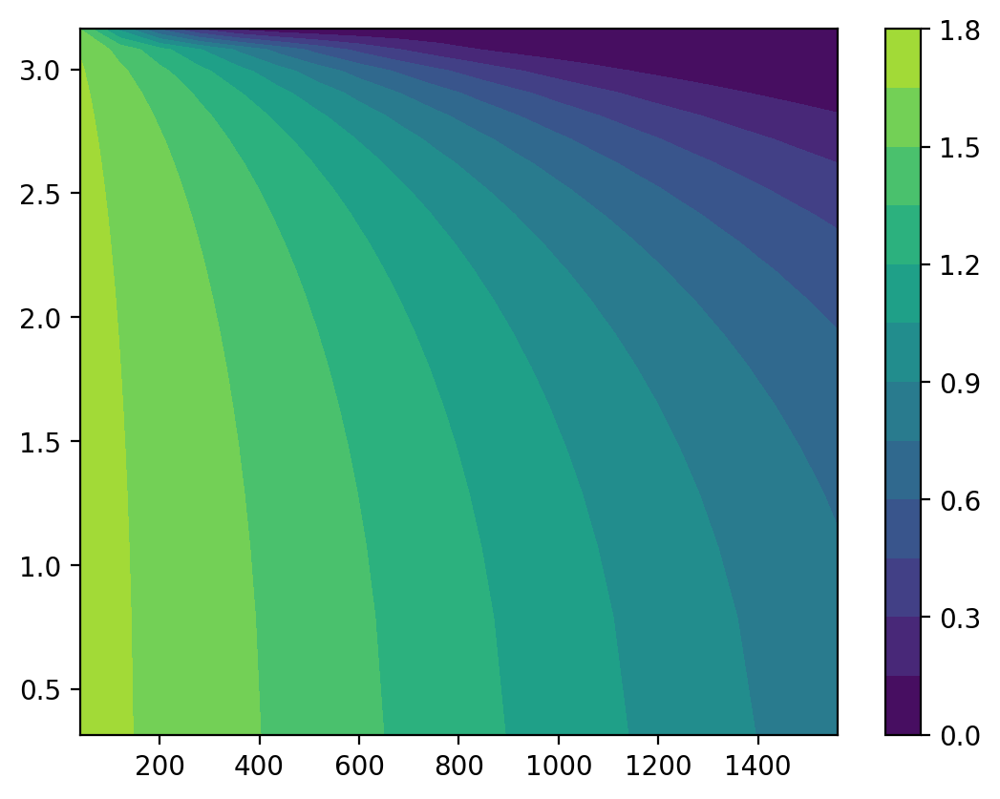

In [55]:
from scipy.special import erfc
zz= (h0-hI)* erfc( np.sqrt( S*xx**2/(4*T*tt))) #+ h0
plt.contourf( xx, np.sqrt( reversed_tt), np.sqrt( zz), vmin=0, vmax=2.0,levels=11,origin="lower" ); plt.colorbar( ); #  ticks=range(0, 3,8)

## Step changes in surface water level: Edelman formula's

In [48]:
# parameters
T = 800   # transmissivity, m^2/d
S = 0.01  # storage coefficient, -
delh = 3  # change in river level, m
t0 = 0    # time of change in river level, d

# solution
from scipy.special import erfc

def h_edelman(x, t, T, S, delh=1, t0=0):
    u = np.sqrt(S * x ** 2 / (4 * T * (t - t0)))
    return delh * erfc(u)

def Qx_edelman(x, t, T, S, delh, t0=0):
    u = np.sqrt(S * x ** 2 / (4 * T * (t - t0)))
    return T * delh * 2 * u / (x * np.sqrt(np.pi)) * np.exp(-u ** 2) 

### basic plot head and Qx vs x

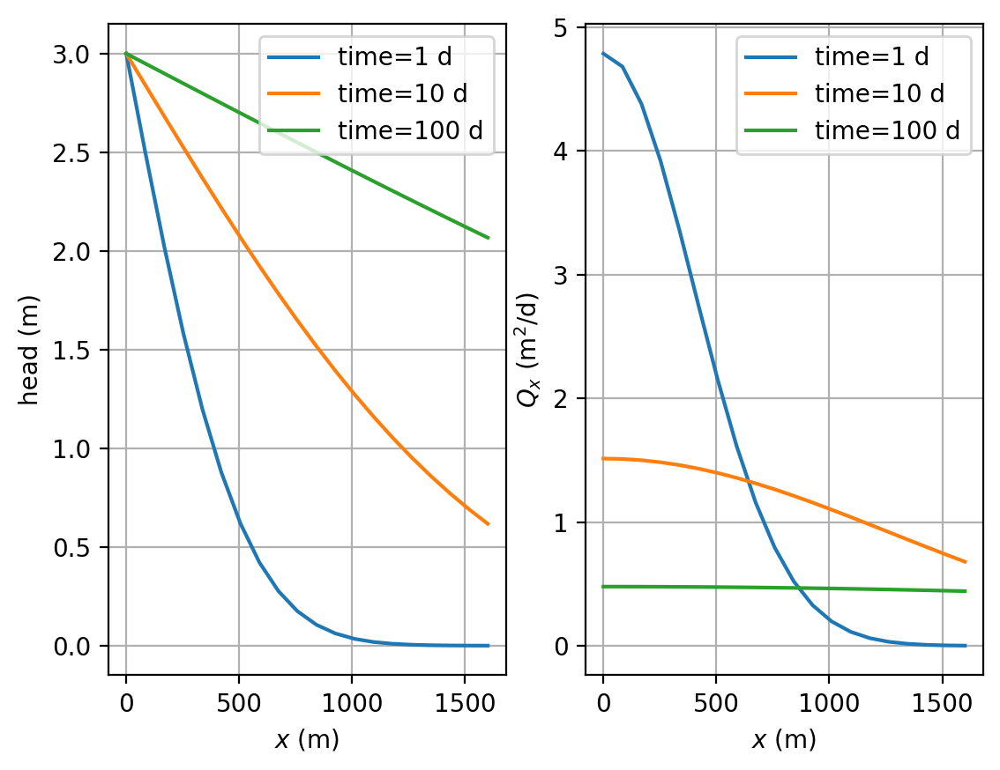

In [49]:
# basic plot head and Qx vs x
x = np.linspace(1e-12, 1600, 20)
plt.subplot(121)
for t in [1, 10, 100]:
    h = h_edelman(x, t, T, S, delh, t0)
    plt.plot(x, h, label=f'time={t} d')
plt.grid()
plt.xlabel('$x$ (m)')
plt.ylabel('head (m)')
plt.legend()
plt.subplot(122)
for t in [1, 10, 100]:
    Qx = Qx_edelman(x, t, T, S, delh, t0)
    plt.plot(x, Qx, label=f'time={t} d')
plt.grid()
plt.xlabel('$x$ (m)')
plt.ylabel('$Q_x$ (m$^2$/d)'); plt.legend();

### basic plot head and Qx vs time

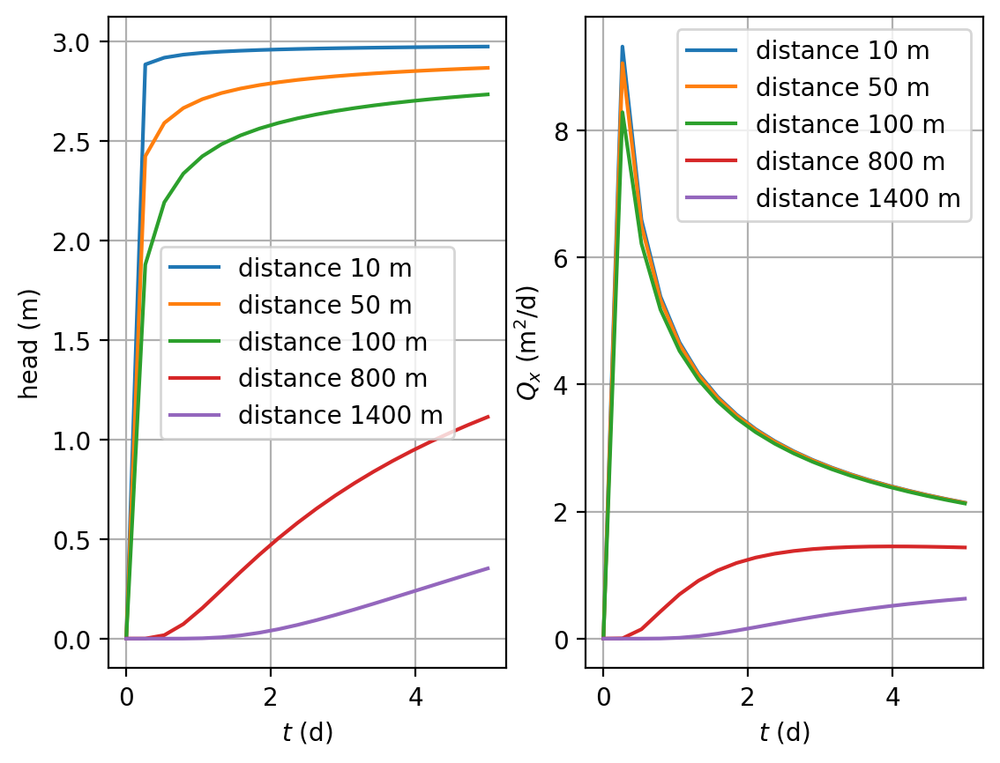

In [53]:
# basic plot head and Qx vs x
t = np.linspace(1e-12, 5, 20)
plt.subplot(121)
for x in [10, 50, 100, 800,1400]:
    h = h_edelman(x, t, T, S, delh, t0)
    plt.plot(t, h, label=f'distance {x} m')
plt.grid()
plt.xlabel('$t$ (d)')
plt.ylabel('head (m)')
plt.legend()
plt.subplot(122)
for x in [10, 50, 100, 800,1400]:
    Qx = Qx_edelman(x, t, T, S, delh, t0)
    plt.plot(t, Qx, label=f'distance {x} m')
plt.grid()
plt.xlabel('$t$ (d)')
plt.ylabel('$Q_x$ (m$^2$/d)'); plt.legend();

---

## Stiff and non-stiff problems

At the moment, we are solving the diffusion problem using a uniform space-step. Just as we can benefit from having time-step refinement during periods of high activity, we can also benefit from spatial grid refinement in areas of high activity.

In this particular case, most of the activity is occurring around where the fixed head boundary exists. Therefore a more appropriate spatial discretisation is arguably achieved using the code:

$x_B=[0,np.logspace(-3,0,N)*L]$

which logarithmically spaces the finite different points over three orders of magnitude, with the smallest grid spacing around $h(53)$. 

Add the above code for $x_B$ to the existing code and run.

You will find the solution takes forever to complete. The reason is that the simulation has become very stiff. Type "ctrl c" in the command window to terminate the simulation.

Sets of coupled ODEs are said to be stiff when the ODEs move at very different rates. By refining the spatial grid, we have created a system whereby the ODEs near are very fast whilst the ODEs near are very slow.

The ode45 solver is not good for stiff problems. Instead, try and use the solver ode15s by changing the code to say

You can read more about how ode15s works in the help files.

---

## Specifying the Jacobian pattern

For large sets of ODEs, the stiff solvers are much more efficient if you specify the Jacobian pattern a priori. So what is the Jacobian pattern?

For the example under consideration, let us define

Now consider the vectors and .

Therefore, the Jacobian pattern for this problem can be seen to be a tri-diagonal sparse matrix of the form:

To implement this Jacobian pattern within your code, replace the line

S = spdiags(Bin,d,m,n) creates an m-by-n sparse matrix S by taking the columns of Bin and placing them along the diagonals specified by d.   spdiags(data, diags, m, n, format)

In [2]:
N=20
matr= np.ones((N,3) ); matr[:4]

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [5]:
diax= np.array([-1 ,0, 1])
#np.diag( )
Dfun= np.diag( diax); Dfun

array([[-1,  0,  0],
       [ 0,  0,  0],
       [ 0,  0,  1]])

In [3]:
import numpy as np
from scipy import sparse
# Define and set the Jacobian pattern
diag= np.ones(N)
diags= np.array([diag ,-2*diag, diag])   # dunno the right  values yet / determinant
diags

array([[ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.],
       [-2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
        -2., -2., -2., -2., -2., -2., -2.],
       [ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.]])

In [4]:
D = sparse.spdiags( diags, np.array([-1 ,0, 1]) ,N,N).toarray()
D
#JPat= sparse.spdiags( np.ones((N,3)), np.array([-1 ,0, 1]) ,N,N)   # under, at and above main diagonal
#JPat

array([[-2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  1., -2.,  1.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  1., -2.,  1.,  0.,  

In [5]:
D.shape

(20, 20)

In [6]:
# from stretched out back to matrix
T= -1/2*sparse.kronsum( D,D); T

<400x400 sparse matrix of type '<class 'numpy.float64'>'
	with 1920 stored elements in Compressed Sparse Row format>

In [ ]:
U = sparse.diags(  )